In [13]:
import requests
import pandas as pd
from opensustainTemplate import *
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

URL = "https://ost.ecosyste.ms/api/v1/projects/images"
FILE_TO_SAVE_AS = "ecosystems_images.json" # the name you want to save file as


resp = requests.get(URL) # making requests to server

with open(FILE_TO_SAVE_AS, "wb") as f: # opening a file handler to create new file 
    f.write(resp.content) # writing content to file

In [14]:
df = pd.read_json(resp.content.decode())
#df.head(30)

In [15]:
names = []
image_urls = []
url = []
description = []
category = []
sub_category = []
language = []

In [16]:
from pathlib import Path

# Specify the directory path
directory = "images"

# Create the directory
path = Path(directory)
path.mkdir(parents=True, exist_ok=True)

Download:  https://github.com/NREL/HOPP/actions/workflows/ci.yml/badge.svg
File Type:  SVG Scalable Vector Graphics image
Could not load image.
cannot identify image file <_io.BytesIO object at 0x7fb63217a130>
Download:  https://user-images.githubusercontent.com/22978370/161757196-c0316b58-6ee8-48a3-a604-4d9aafc3adb4.png
File Type:  PNG image data, 3543 x 1518, 8-bit/color RGBA, non-interlaced
Download:  https://img.shields.io/badge/License-CC_BY--SA_4.0-lightgrey.svg
File Type:  SVG Scalable Vector Graphics image
Could not load image.
cannot identify image file <_io.BytesIO object at 0x7fb632177310>
Download:  https://user-images.githubusercontent.com/22978370/158154235-06794acb-d163-447e-80ca-16e9cd60f11c.png
File Type:  PNG image data, 2745 x 1289, 8-bit/color RGBA, non-interlaced
Download:  https://user-images.githubusercontent.com/22978370/157669864-2d5d0df7-1fb0-40b6-ace3-a625cfef6195.png
File Type:  PNG image data, 729 x 760, 8-bit/color RGBA, non-interlaced
Download:  https://g
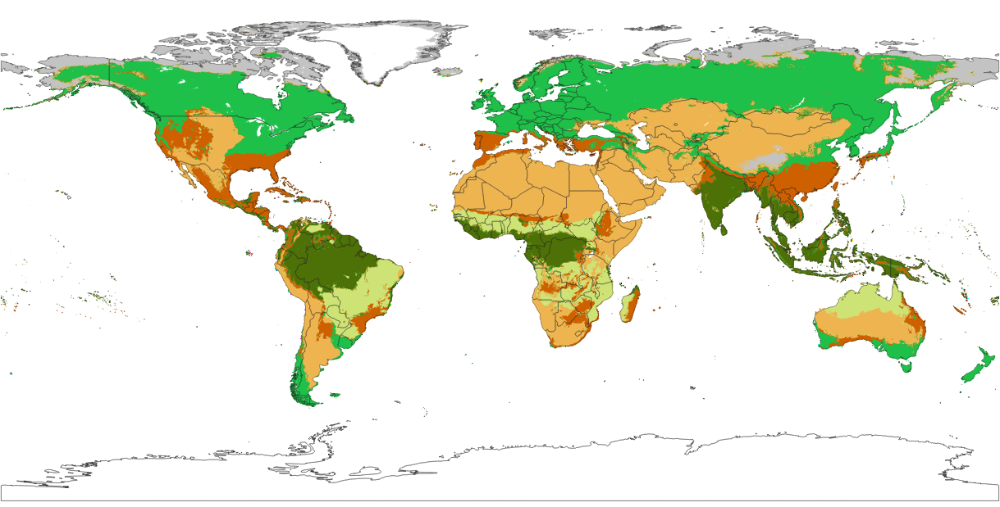
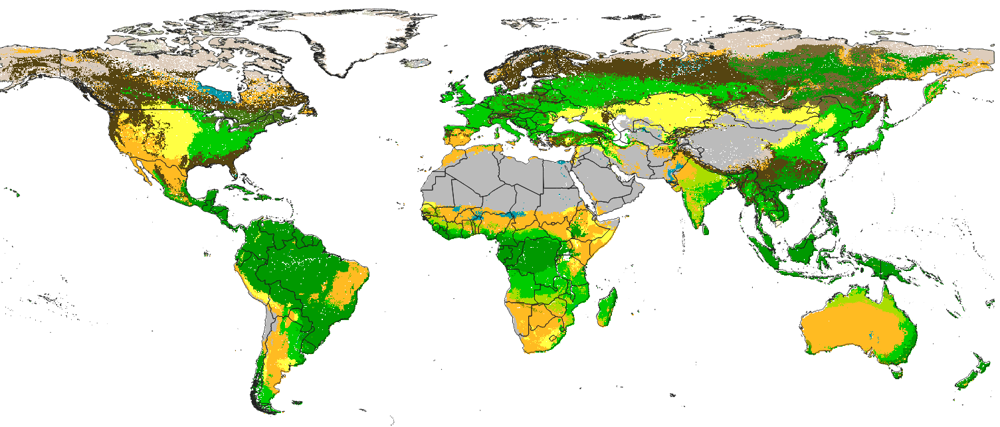
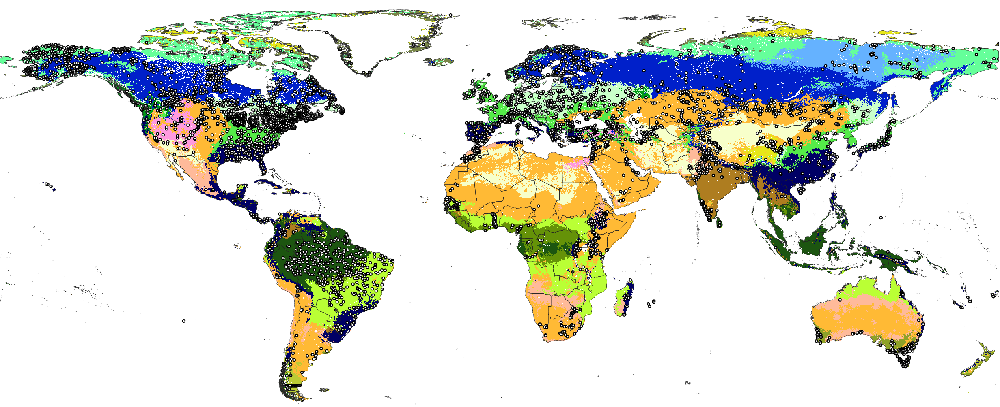
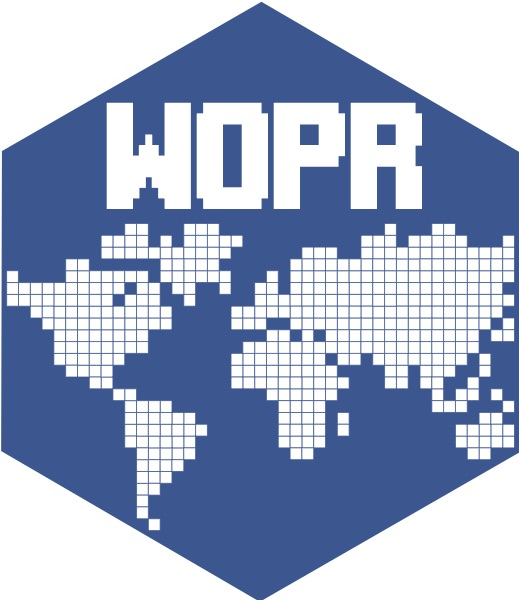
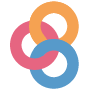
...
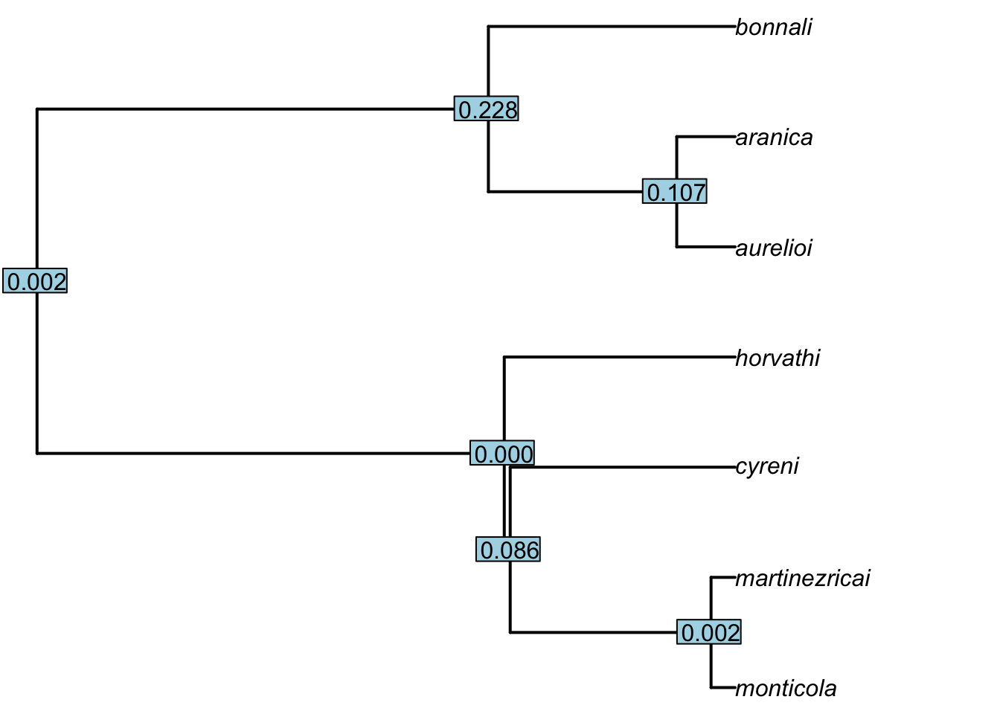
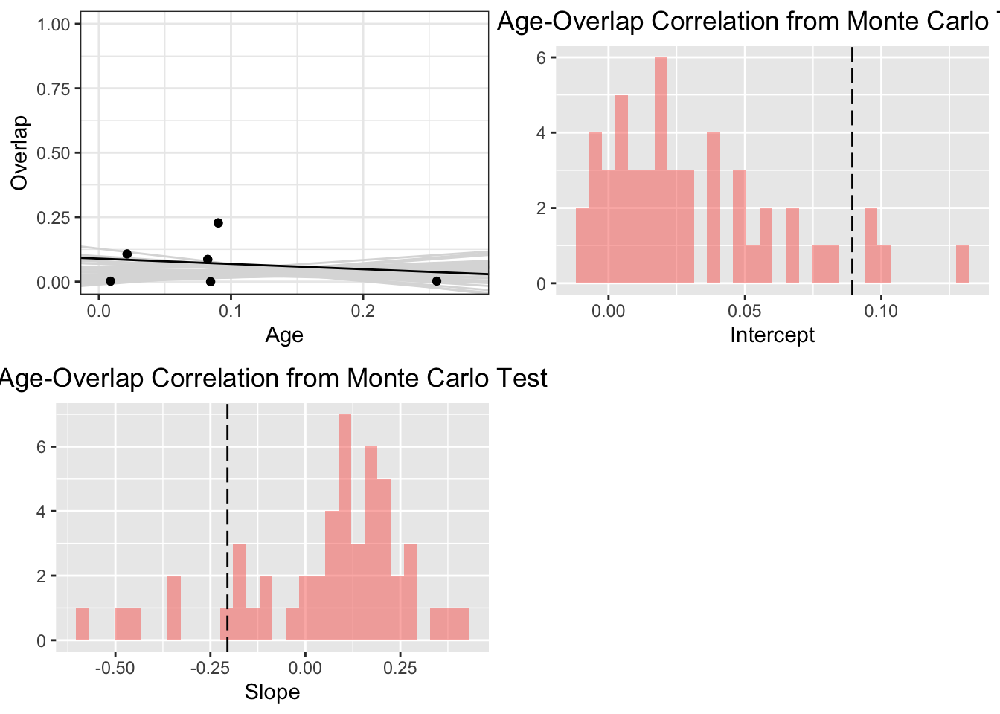
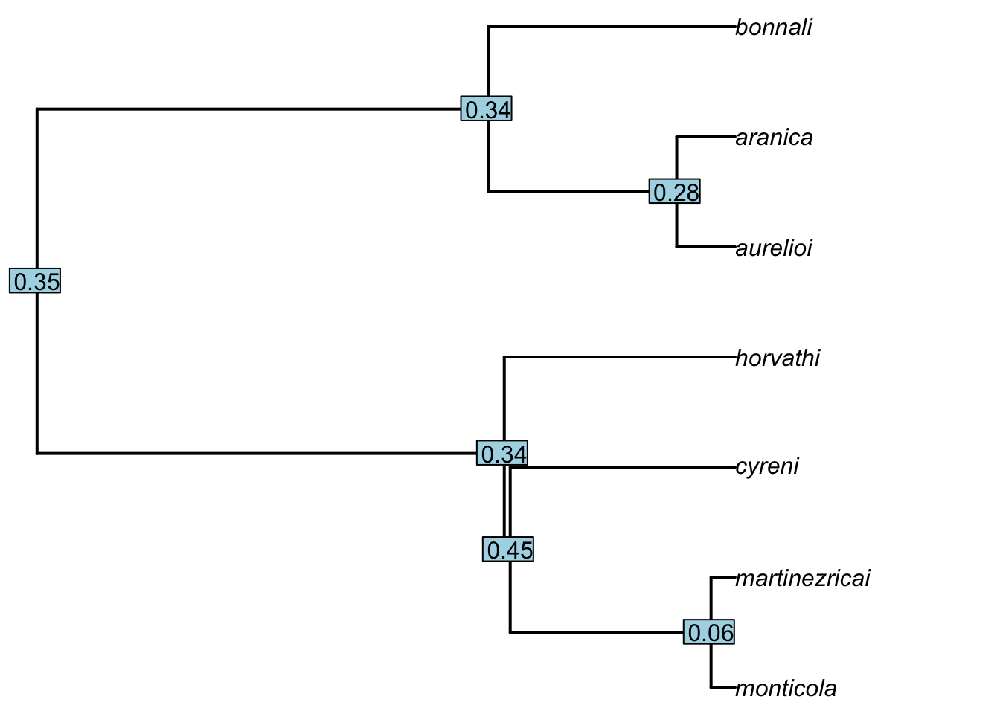
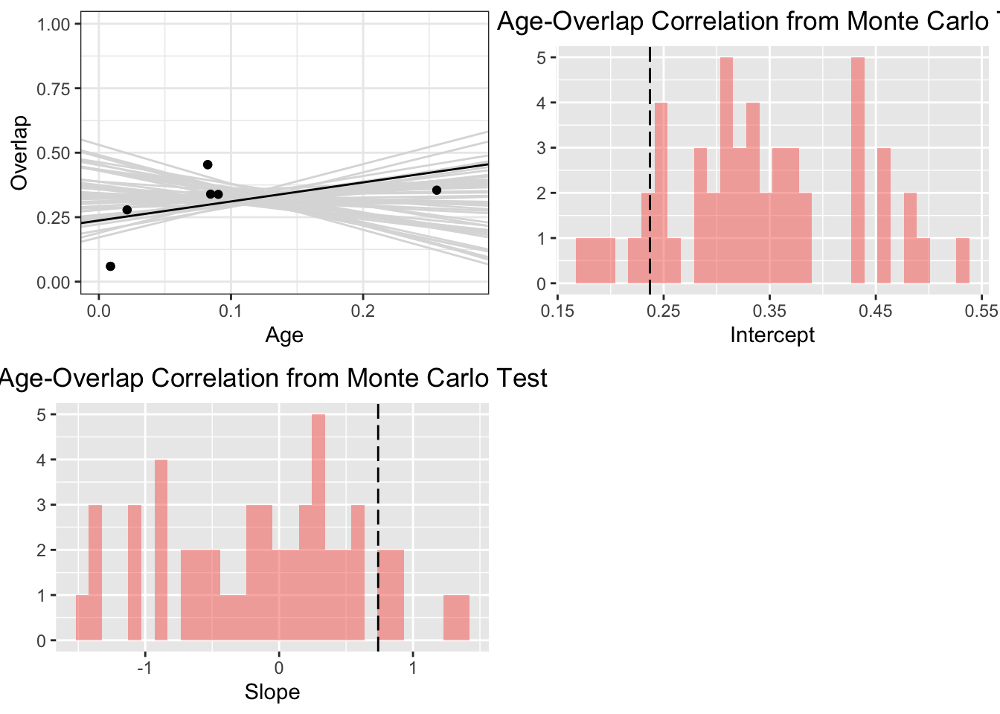
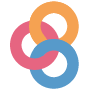

In [17]:
import time
import os
import requests
import magic
from PIL import Image
from io import BytesIO
for index, row in df.iterrows():
    for image_url in row['readme_image_urls']:
        time.sleep(0.2)
        try:
            print("Download: ",image_url)
            filename = image_url.split('/')[-1]
            r = requests.get(image_url, allow_redirects=True)
            file_type = magic.from_buffer(r.content)
            print("File Type: ",file_type)
            image = Image.open(BytesIO(r.content))
            open(os.path.join(directory,filename),'wb').write(r.content)
        except Exception as e:
            print("Could not load image.")
            print(e)